### ✓代码跑通
请大家根据课上所学内容，在 G类（生成器）和D类（判别器）中补全代码，构造GAN网络，保证程序跑通。
### ✓调优
思考并动手进行调优，使得生成的数据效果更好！

# 任务描述

GAN全称是 Generative Adversarial Network，即生成对抗网络。在14年被Goodfellow等提出后即热度不断一经推出便引爆全场，此后各种花式变体DCGAN、WGAN、CGAN、CYCLEGAN、STARGAN、LSGAN等层出不穷，在“换脸”、“换衣”、“换天地”等应用场景下生成的图像、视频以假乱真，好不热闹。

生成对抗网络一般由一个生成器（生成网络），和一个判别器（判别网络）组成。

生成器的作用是，通过学习**训练集数据的特征**，在判别器的指导下，将随机噪声分布尽量拟合为训练数据的真实分布，从而生成具有训练集特征的相似数据。而判别器则负责区分输入的数据是真实的还是生成器生成的假数据，并反馈给生成器。两个网络交替训练，能力同步提高，直到生成网络生成的数据能够以假乱真，并与与判别网络的能力达到一定均衡。



# 数据准备

训练集数据使用飞桨框架内置函数paddle.dataset.mnist.train()、paddle.reader.shuffle()和paddle.batch()进行读取、打乱和划分batch。读取图片数据处理为 [N,W,H] 格式。

要喂入生成器高斯分布的噪声隐变量z的维度设置为100。

In [37]:
import paddle
import paddle.fluid as fluid
from paddle.fluid.dygraph import Conv2D, Pool2D, Linear
import numpy as np
import matplotlib.pyplot as plt

# 噪声维度
Z_DIM = 100
BATCH_SIZE = 128
# 读取真实图片的数据集，这里去除了数据集中的label数据，因为label在这里使用不上，这里不考虑标签分类问题。
def mnist_reader(reader):
    def r():
        for img, label in reader():
            yield img.reshape(1, 28, 28)
    return r

# 噪声生成，通过由噪声来生成假的图片数据输入。
def z_reader():
    while True:
        yield np.random.normal(0.0, 1.0, (Z_DIM, 1, 1)).astype('float32')                #正态分布，正态分布的均值、标准差、参数

# 生成真实图片reader
mnist_generator = paddle.batch(
        paddle.reader.shuffle(mnist_reader(paddle.dataset.mnist.train()), 30000),
        batch_size=BATCH_SIZE)

# 生成假图片的reader
z_generator = paddle.batch(z_reader, batch_size=BATCH_SIZE)

测试下数据读取器和高斯噪声生成器。

一个batch图片数据的形状：batch_size = 128 , data_shape = (1, 28, 28)


<function matplotlib.pyplot.show(*args, **kw)>

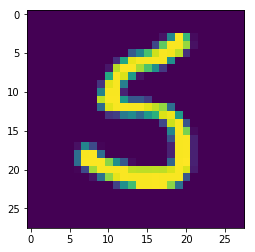

In [38]:
import matplotlib.pyplot as plt
%matplotlib inline

pics_tmp = next(mnist_generator())
print('一个batch图片数据的形状：batch_size =', len(pics_tmp), ', data_shape =', pics_tmp[0].shape)

plt.imshow(pics_tmp[0][0]) # (28,28)
plt.show

In [39]:
z_tmp = next(z_generator())
print('一个batch噪声z的形状：batch_size =', len(z_tmp), ', data_shape =', z_tmp[0].shape)

一个batch噪声z的形状：batch_size = 128 , data_shape = (100, 1, 1)


# GAN网络

GAN性能的提升从生成器G和判别器D进行左右互搏、交替完善的过程得到的。所以其G网络和D网络的能力应该设计得相近，复杂度也差不多。这个项目中的生成器，采用了两个全链接层接两组上采样和转置卷积层，将输入的噪声Z逐渐转化为1×28×28的单通道图片输出。

生成器结构：

<img src="https://ai-studio-static-online.cdn.bcebos.com/625f6642177144c49bcd01b05a78e19094fe74d0f51a4cdb989648d3adcbe362" style="height:400px;width:600px">

判别器的结构正好相反，先通过两组卷积和池化层将输入的图片转化为越来越小的特征图，再经过两层全链接层，输出图片是真是假的二分类结果。

判别器结构：
<br/>

<img src="https://ai-studio-static-online.cdn.bcebos.com/d3a0dc774d0d41758bc674deb189a76e653815de352c4e6d951807be13baec91" style="height:400px;width:600px">


In [40]:
# 通过上采样扩大特征图
class G(fluid.dygraph.Layer):
    def __init__(self, name_scope):
        super(G, self).__init__(name_scope)
        name_scope = self.full_name()

        self.fcl = Linear(input_dim=100,output_dim=1024)
        self.bn1 = fluid.dygraph.BatchNorm(num_channels=1024,act='tanh')

        self.fc2 = Linear(input_dim=1024,output_dim=128*7*7)
        self.bn2 = fluid.dygraph.BatchNorm(num_channels=128*7*7,act='tanh')

        self.conv1 = Conv2D(num_channels=128,num_filters=64,filter_size=5,padding=2)
        self.bn3 = fluid.dygraph.BatchNorm(num_channels=64,act='tanh')

        self.conv2 = Conv2D(num_channels=64,num_filters=1,filter_size=5,padding=2,act='tanh')

    def forward(self, z):
        z = fluid.layers.reshape(z,shape=[-1,100])
        y = self.fcl(z)
        y = self.bn1(y)

        y = self.fc2(y)
        y = self.bn2(y)

        y = fluid.layers.reshape(y,shape=[-1,128,7,7])
        y = fluid.layers.image_resize(y,scale=2)

        y = self.conv1(y)
        y = self.bn3(y)

        y = fluid.layers.image_resize(y,scale=2)
        y = self.conv2(y)
        return y


class D(fluid.dygraph.Layer):
    def __init__(self, name_scope):
        super(D, self).__init__(name_scope)
        name_scope = self.full_name()

        self.conv1 = Conv2D(num_channels=1,num_filters=64,filter_size=3)
        self.bn1 = fluid.dygraph.BatchNorm(num_channels=64,act='relu')
        self.pool1 = Pool2D(pool_size=2,pool_stride=2)

        self.conv2 = Conv2D(num_channels=64,num_filters=128,filter_size=3)
        self.bn2 = fluid.dygraph.BatchNorm(num_channels=128,act='relu')
        self.pool2 = Pool2D(pool_size=2,pool_stride=2)

        self.fc1 = Linear(input_dim=128*5*5,output_dim=1024)
        self.bnfc1 = fluid.dygraph.BatchNorm(num_channels=1024,act='relu')
        self.fc2 = Linear(input_dim=1024,output_dim=1)


    def forward(self, img):
        y = self.conv1(img)
        y = self.bn1(y)
        y = self.pool1(y)
        y = self.conv2(y)
        y = self.bn2(y)
        y = self.pool2(y)
        y = fluid.layers.reshape(y,shape=[-1,128*5*5])
        y = self.fc1(y)
        y = self.bnfc1(y)
        y = self.fc2(y)
        return y


测试生成器G网络和判别器D网络的前向计算结果。一个batch的数据，输出一张图片。

生成器G生成图片数据的形状： (128, 1, 28, 28)
判别器D判别生成的图片的概率数据形状： (128, 1)
[1.722628]


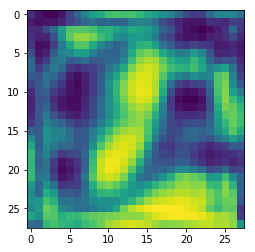

In [41]:
# 测试生成网络G和判别网络D
with fluid.dygraph.guard():
    g_tmp = G('G')
    tmp_g = g_tmp(fluid.dygraph.to_variable(np.array(z_tmp))).numpy()
    print('生成器G生成图片数据的形状：', tmp_g.shape)
    plt.imshow(tmp_g[0][0])
    plt.show()
    
    d_tmp = D('D')
    tmp_d = d_tmp(fluid.dygraph.to_variable(tmp_g)).numpy()
    print('判别器D判别生成的图片的概率数据形状：', tmp_d.shape)
    print(max(tmp_d))

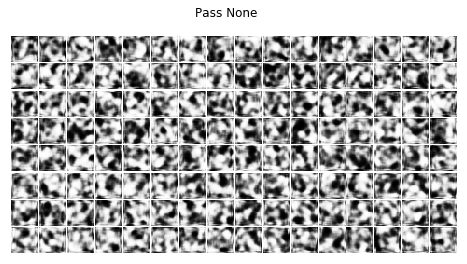

In [42]:
# 显示图片，构建一个16*n大小(n=batch_size/16)的图片阵列，把预测的图片打印到note中。
import matplotlib.pyplot as plt
%matplotlib inline

def show_image_grid(images, batch_size=128, pass_id=None):
    fig = plt.figure(figsize=(8, batch_size/32))
    fig.suptitle("Pass {}".format(pass_id))
    gs = plt.GridSpec(int(batch_size/16), 16)
    gs.update(wspace=0.05, hspace=0.05)

    for i, image in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(image[0], cmap='Greys_r')    
    plt.show()

show_image_grid(tmp_g, BATCH_SIZE)

# 网络训练

网络的训练优化目标就是如下公式：

![](https://ai-studio-static-online.cdn.bcebos.com/d60b2999c2b44e3397117b5d6ece1eb7efb5a677e5c044b7ac56310af49f532c)

公式出自Goodfellow在2014年发表的论文[Generative Adversarial Nets](https://arxiv.org/pdf/1406.2661v1.pdf)。
这里简单介绍下公式的含义和如何应用到代码中。上式中等号左边的部分：

![](https://ai-studio-static-online.cdn.bcebos.com/d4f6e2307d1a4ec586f2e546031cf833e42aea25399346f093f0eedd655be207)表示的是生成样本和真实样本的差异度，可以使用二分类（真、假两个类别）的交叉商损失。

![](https://ai-studio-static-online.cdn.bcebos.com/91e096cf8e6742beac8f7de6e80df1bf6729c19df096424fa915f03f874e9bc1)
表示在生成器固定的情况下，通过最大化交叉商损失![](https://ai-studio-static-online.cdn.bcebos.com/d4f6e2307d1a4ec586f2e546031cf833e42aea25399346f093f0eedd655be207)来更新判别器D的参数。

![](https://ai-studio-static-online.cdn.bcebos.com/b9c493da756a45cf949445d7686b09583372cf9eb90c4a7eace609a3ef180dc3)
表示生成器要在判别器最大化真、假图片交叉商损失![](https://ai-studio-static-online.cdn.bcebos.com/d4f6e2307d1a4ec586f2e546031cf833e42aea25399346f093f0eedd655be207)的情况下，最小化这个交叉商损失。

等式的右边其实就是将等式左边的交叉商损失公式展开，并写成概率分布的期望形式。详细的推导请参见原论文《[Generative Adversarial Nets](https://arxiv.org/pdf/1406.2661v1.pdf)》。

下面是训练模型的代码，有详细的注释。大致过程是：先用真图片训练一次判别器d的参数，再用生成器g生成的假图片训练一次判别器d的参数，最后用判别器d判断生成器g生成的假图片的概率值更新一次生成器g的参数，即每轮训练先训练两次判别器d，再训练一次生成器g，使得判别器d的能力始终稍稍高于生成器g一些。

epoch = 0 , batch = 99 , real_d_loss = [0.41234463] , fake_d_loss = [0.39865685] g_loss = [1.2426103]


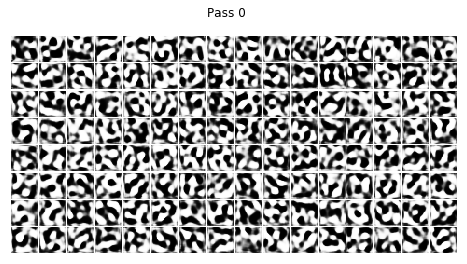

epoch = 0 , batch = 199 , real_d_loss = [0.29750693] , fake_d_loss = [0.30046457] g_loss = [1.5072023]


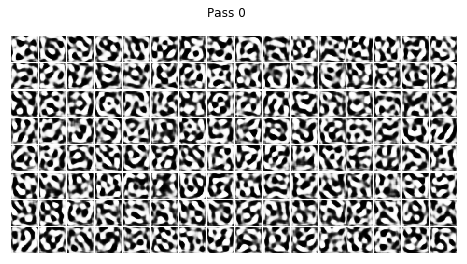

epoch = 0 , batch = 299 , real_d_loss = [0.26086378] , fake_d_loss = [0.24149594] g_loss = [1.7123165]


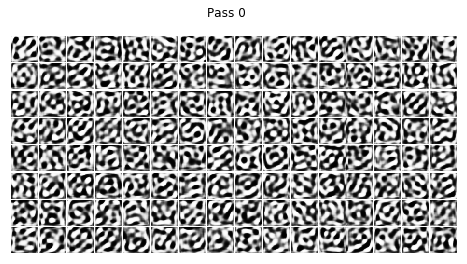

epoch = 0 , batch = 399 , real_d_loss = [0.24536422] , fake_d_loss = [0.19409601] g_loss = [1.8993026]


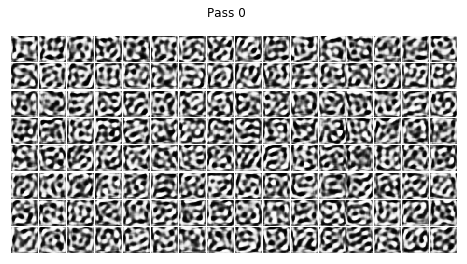

epoch = 1 , batch = 31 , real_d_loss = [0.15990192] , fake_d_loss = [0.16902491] g_loss = [2.077393]


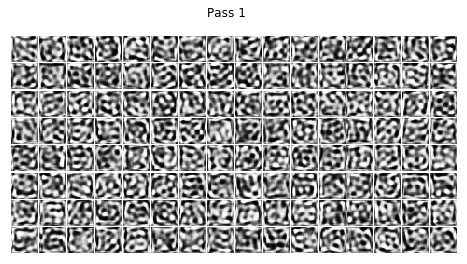

epoch = 1 , batch = 131 , real_d_loss = [0.18365881] , fake_d_loss = [0.14741068] g_loss = [2.1676064]


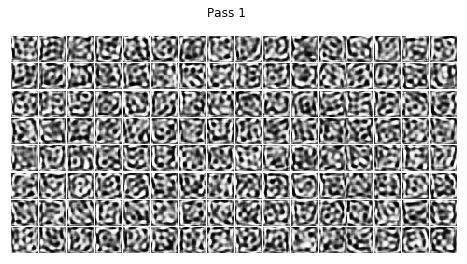

epoch = 1 , batch = 231 , real_d_loss = [0.15357119] , fake_d_loss = [0.12347373] g_loss = [2.361156]


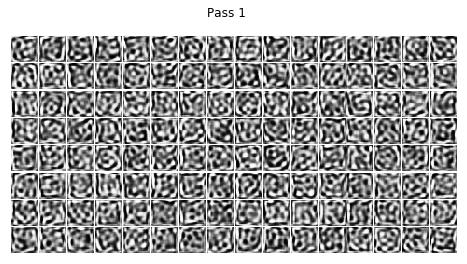

epoch = 1 , batch = 331 , real_d_loss = [0.09450913] , fake_d_loss = [0.10986416] g_loss = [2.4560199]


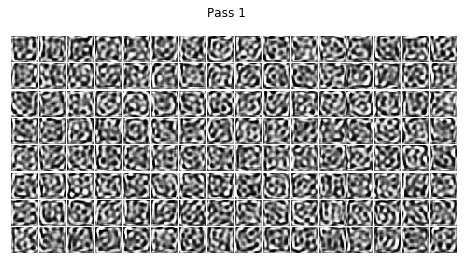

epoch = 1 , batch = 431 , real_d_loss = [0.10050313] , fake_d_loss = [0.10105421] g_loss = [2.5489619]


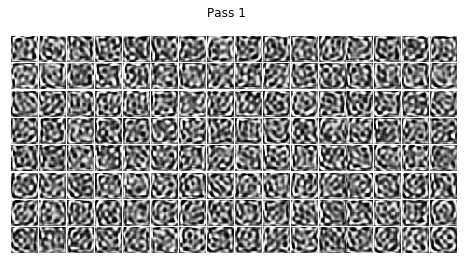

epoch = 2 , batch = 63 , real_d_loss = [0.0976899] , fake_d_loss = [0.09054562] g_loss = [2.633719]


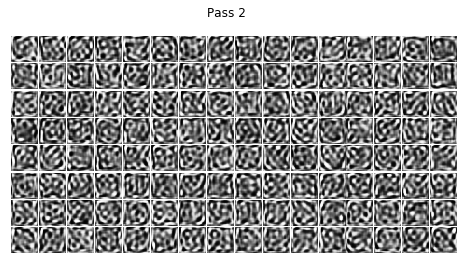

epoch = 2 , batch = 163 , real_d_loss = [0.10219187] , fake_d_loss = [0.09144585] g_loss = [2.6762779]


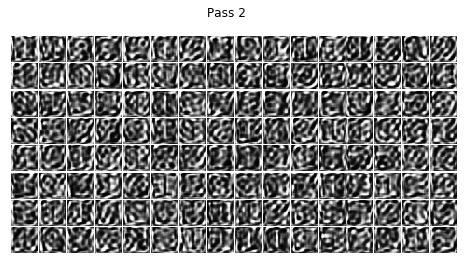

epoch = 2 , batch = 263 , real_d_loss = [0.20996289] , fake_d_loss = [0.17463169] g_loss = [2.2882907]


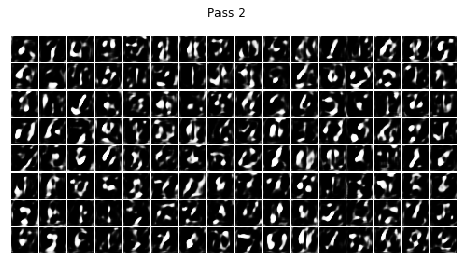

epoch = 2 , batch = 363 , real_d_loss = [0.19710638] , fake_d_loss = [0.16385713] g_loss = [2.25279]


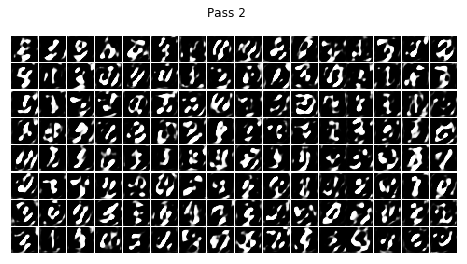

epoch = 2 , batch = 463 , real_d_loss = [0.1632459] , fake_d_loss = [0.15717167] g_loss = [2.2620695]


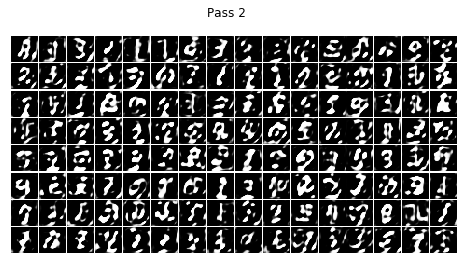

epoch = 3 , batch = 95 , real_d_loss = [0.1728887] , fake_d_loss = [0.16568416] g_loss = [2.282696]


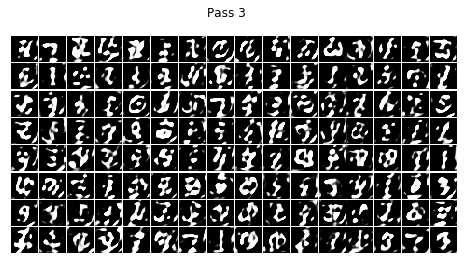

epoch = 3 , batch = 195 , real_d_loss = [0.17129281] , fake_d_loss = [0.15213187] g_loss = [2.279541]


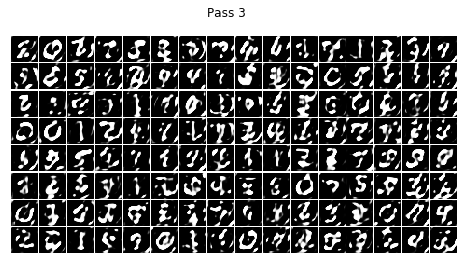

epoch = 3 , batch = 295 , real_d_loss = [0.17055736] , fake_d_loss = [0.13721469] g_loss = [2.3853512]


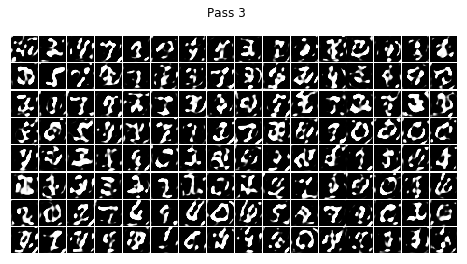

epoch = 3 , batch = 395 , real_d_loss = [0.15224832] , fake_d_loss = [0.14748114] g_loss = [2.3958604]


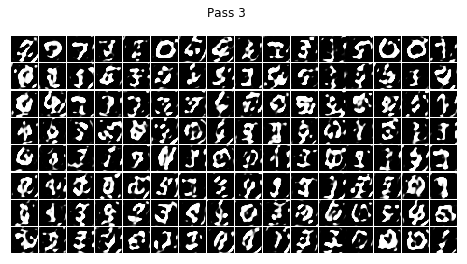

epoch = 4 , batch = 27 , real_d_loss = [0.22073449] , fake_d_loss = [0.17194569] g_loss = [2.2473345]


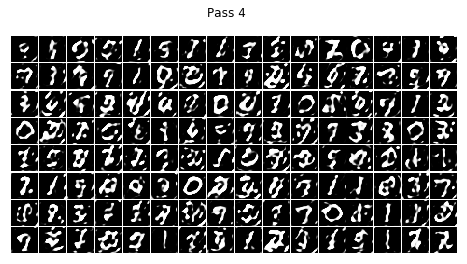

epoch = 4 , batch = 127 , real_d_loss = [0.21829434] , fake_d_loss = [0.21908987] g_loss = [2.0687206]


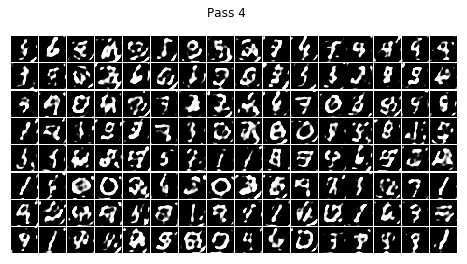

epoch = 4 , batch = 227 , real_d_loss = [0.33862692] , fake_d_loss = [0.22395049] g_loss = [2.1765103]


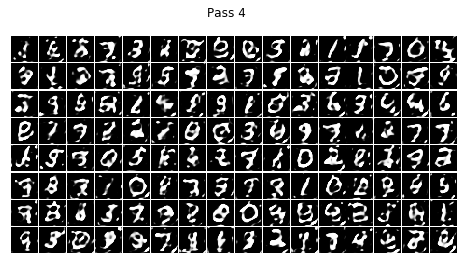

epoch = 4 , batch = 327 , real_d_loss = [0.23767239] , fake_d_loss = [0.22206166] g_loss = [2.0054045]


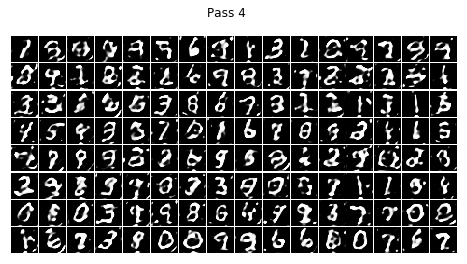

epoch = 4 , batch = 427 , real_d_loss = [0.30656153] , fake_d_loss = [0.23810533] g_loss = [1.9768354]


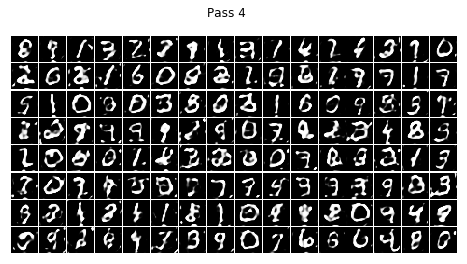

epoch = 5 , batch = 59 , real_d_loss = [0.2982756] , fake_d_loss = [0.2571497] g_loss = [1.9027556]


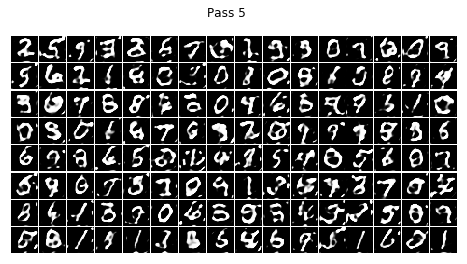

epoch = 5 , batch = 159 , real_d_loss = [0.26531768] , fake_d_loss = [0.24444526] g_loss = [1.9323891]


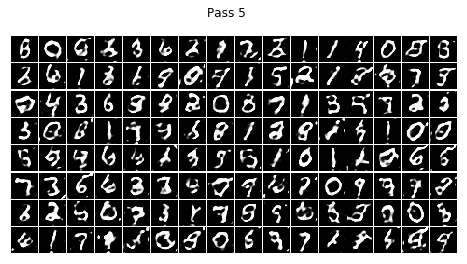

epoch = 5 , batch = 259 , real_d_loss = [0.3863598] , fake_d_loss = [0.2503297] g_loss = [1.9495556]


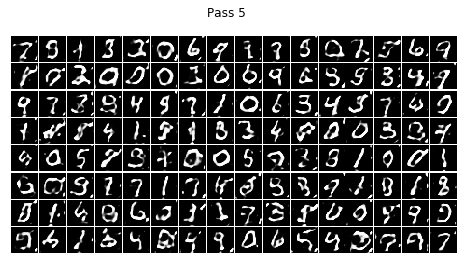

epoch = 5 , batch = 359 , real_d_loss = [0.3581623] , fake_d_loss = [0.30326408] g_loss = [1.7529027]


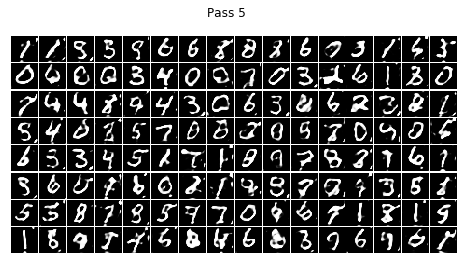

epoch = 5 , batch = 459 , real_d_loss = [0.28386867] , fake_d_loss = [0.25856632] g_loss = [1.8666363]


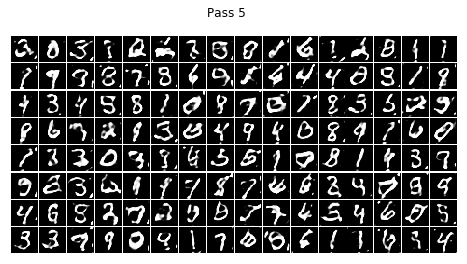

epoch = 6 , batch = 91 , real_d_loss = [0.37624618] , fake_d_loss = [0.2408792] g_loss = [1.9237686]


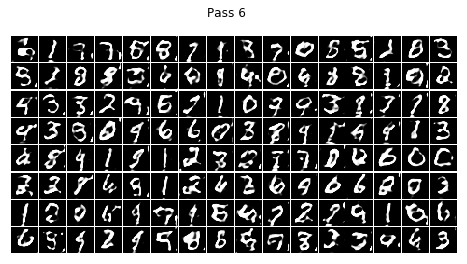

epoch = 6 , batch = 191 , real_d_loss = [0.3607254] , fake_d_loss = [0.33129025] g_loss = [1.6107609]


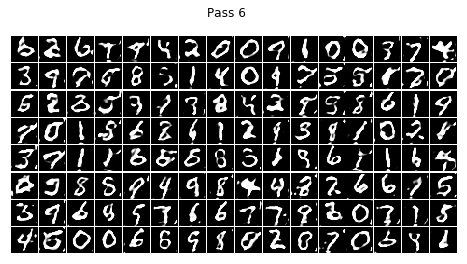

epoch = 6 , batch = 291 , real_d_loss = [0.35490522] , fake_d_loss = [0.33470887] g_loss = [1.6282941]


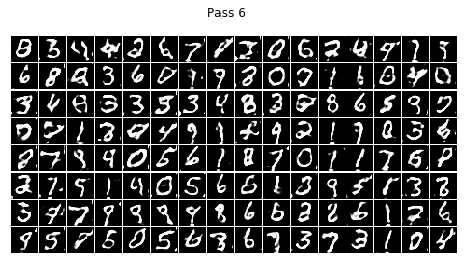

epoch = 6 , batch = 391 , real_d_loss = [0.3500255] , fake_d_loss = [0.34014046] g_loss = [1.5751716]


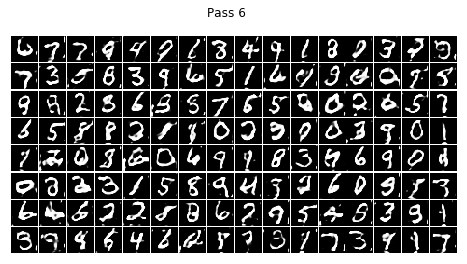

epoch = 7 , batch = 23 , real_d_loss = [0.37021416] , fake_d_loss = [0.31291425] g_loss = [1.6016023]


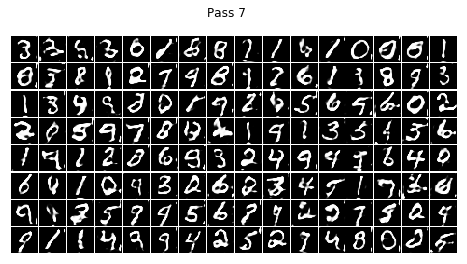

epoch = 7 , batch = 123 , real_d_loss = [0.35233045] , fake_d_loss = [0.33332348] g_loss = [1.5832586]


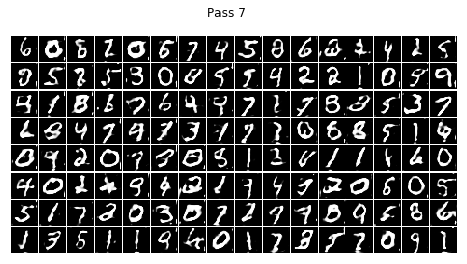

epoch = 7 , batch = 223 , real_d_loss = [0.37712324] , fake_d_loss = [0.36776268] g_loss = [1.5417674]


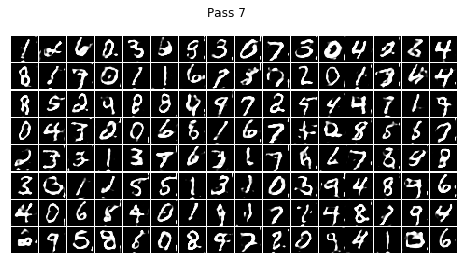

epoch = 7 , batch = 323 , real_d_loss = [0.39093554] , fake_d_loss = [0.30276865] g_loss = [1.665751]


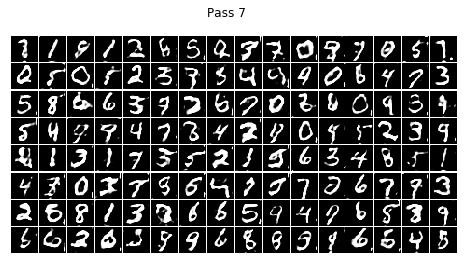

epoch = 7 , batch = 423 , real_d_loss = [0.34968108] , fake_d_loss = [0.32199728] g_loss = [1.5493077]


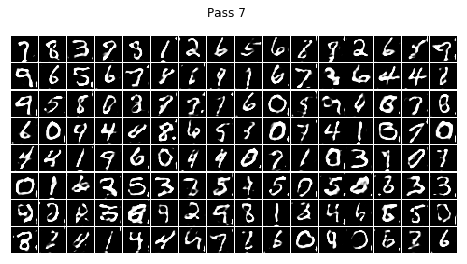

epoch = 8 , batch = 55 , real_d_loss = [0.36747378] , fake_d_loss = [0.3217472] g_loss = [1.5904137]


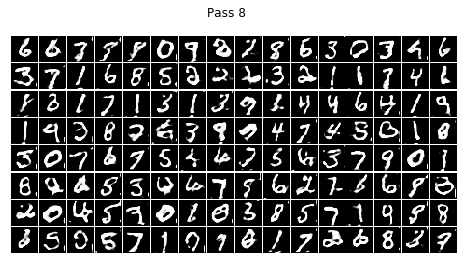

epoch = 8 , batch = 155 , real_d_loss = [0.38274103] , fake_d_loss = [0.30975842] g_loss = [1.597686]


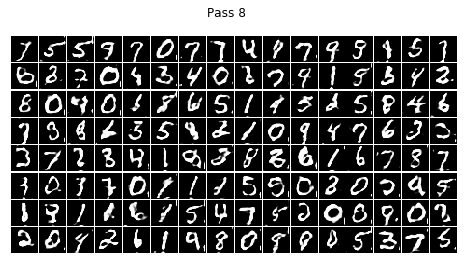

epoch = 8 , batch = 255 , real_d_loss = [0.3247305] , fake_d_loss = [0.31479254] g_loss = [1.6083503]


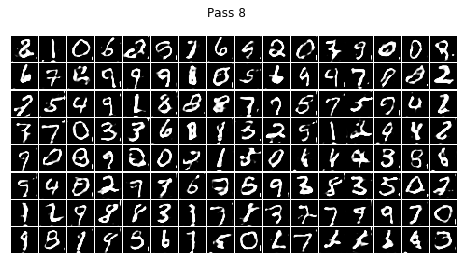

epoch = 8 , batch = 355 , real_d_loss = [0.3992578] , fake_d_loss = [0.33850166] g_loss = [1.5336022]


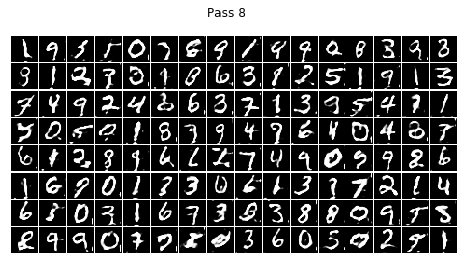

epoch = 8 , batch = 455 , real_d_loss = [0.32128263] , fake_d_loss = [0.3485453] g_loss = [1.5520316]


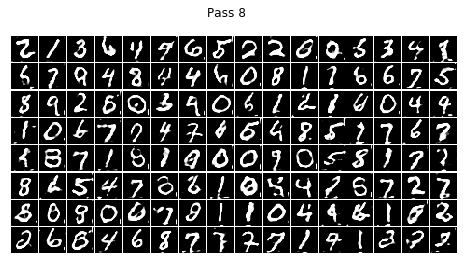

epoch = 9 , batch = 87 , real_d_loss = [0.38939708] , fake_d_loss = [0.3570542] g_loss = [1.5246274]


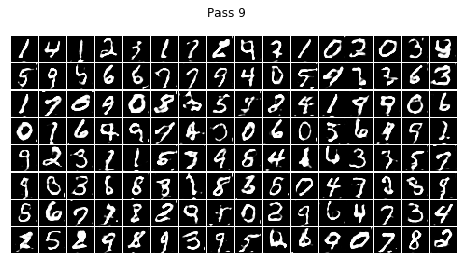

epoch = 9 , batch = 187 , real_d_loss = [0.3923274] , fake_d_loss = [0.32644272] g_loss = [1.5592504]


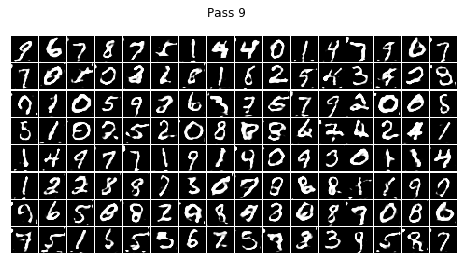

epoch = 9 , batch = 287 , real_d_loss = [0.3583696] , fake_d_loss = [0.3906225] g_loss = [1.4365326]


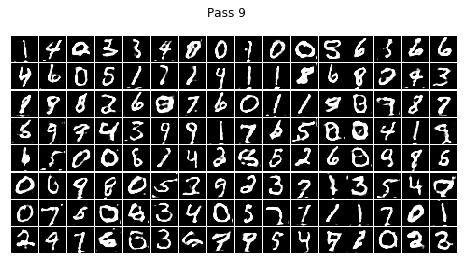

epoch = 9 , batch = 387 , real_d_loss = [0.3890641] , fake_d_loss = [0.33109778] g_loss = [1.5578672]


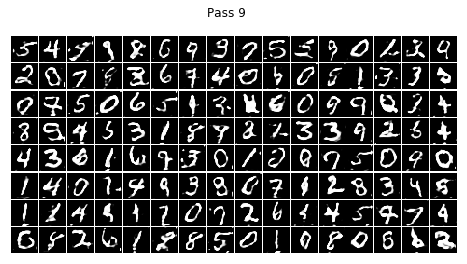

epoch = 10 , batch = 19 , real_d_loss = [0.3271255] , fake_d_loss = [0.30755758] g_loss = [1.60056]


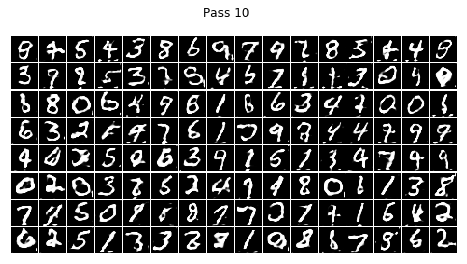

epoch = 10 , batch = 119 , real_d_loss = [0.38032117] , fake_d_loss = [0.32146308] g_loss = [1.5637635]


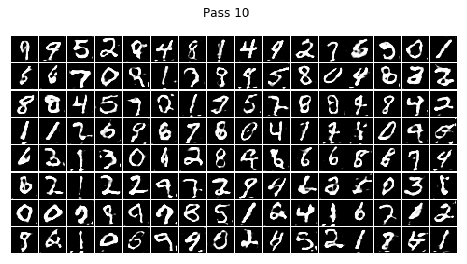

epoch = 10 , batch = 219 , real_d_loss = [0.37467575] , fake_d_loss = [0.31769133] g_loss = [1.5975105]


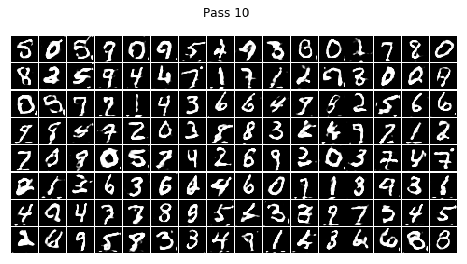

epoch = 10 , batch = 319 , real_d_loss = [0.41450056] , fake_d_loss = [0.32881832] g_loss = [1.5619366]


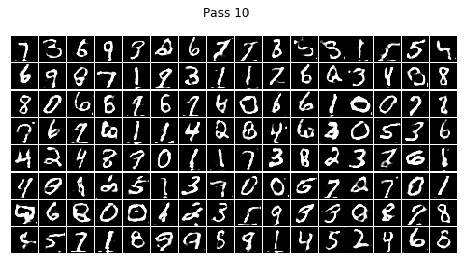

epoch = 10 , batch = 419 , real_d_loss = [0.35544568] , fake_d_loss = [0.32319543] g_loss = [1.5520817]


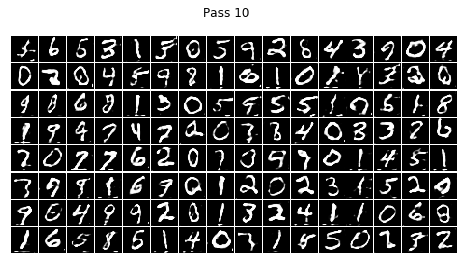

epoch = 11 , batch = 51 , real_d_loss = [0.28972688] , fake_d_loss = [0.33130452] g_loss = [1.5359228]


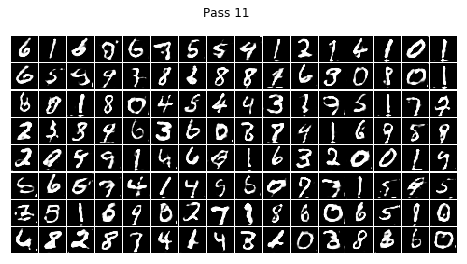

epoch = 11 , batch = 151 , real_d_loss = [0.39362895] , fake_d_loss = [0.31130546] g_loss = [1.6146502]


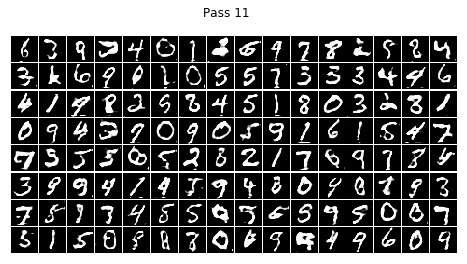

epoch = 11 , batch = 251 , real_d_loss = [0.3376969] , fake_d_loss = [0.29691577] g_loss = [1.6393822]


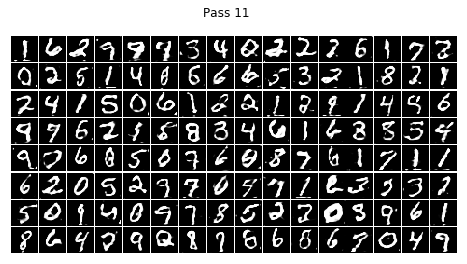

epoch = 11 , batch = 351 , real_d_loss = [0.362905] , fake_d_loss = [0.32557258] g_loss = [1.5559394]


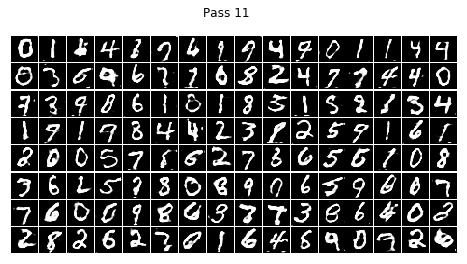

epoch = 11 , batch = 451 , real_d_loss = [0.36145782] , fake_d_loss = [0.4063307] g_loss = [1.4197161]


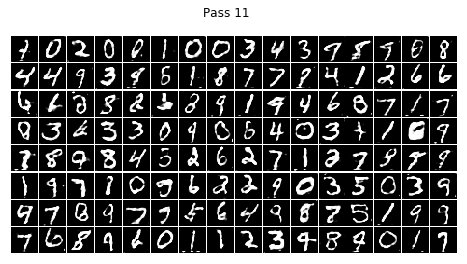

epoch = 12 , batch = 83 , real_d_loss = [0.3655675] , fake_d_loss = [0.3042745] g_loss = [1.6171767]


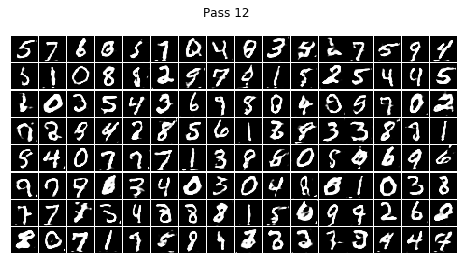

epoch = 12 , batch = 183 , real_d_loss = [0.42495298] , fake_d_loss = [0.32678184] g_loss = [1.5793074]


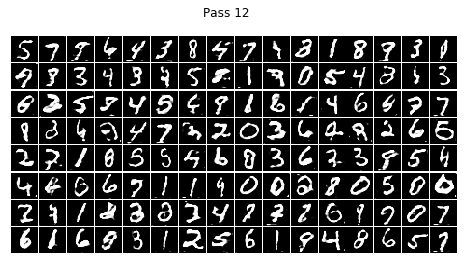

epoch = 12 , batch = 283 , real_d_loss = [0.3373391] , fake_d_loss = [0.31096256] g_loss = [1.5995023]


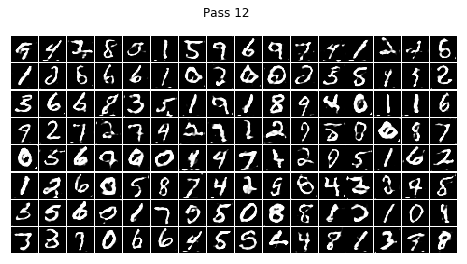

epoch = 12 , batch = 383 , real_d_loss = [0.30713925] , fake_d_loss = [0.32851517] g_loss = [1.5445294]


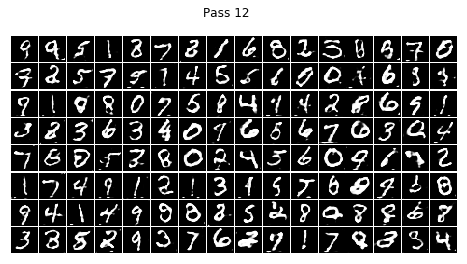

epoch = 13 , batch = 15 , real_d_loss = [0.35634407] , fake_d_loss = [0.34180963] g_loss = [1.5154436]


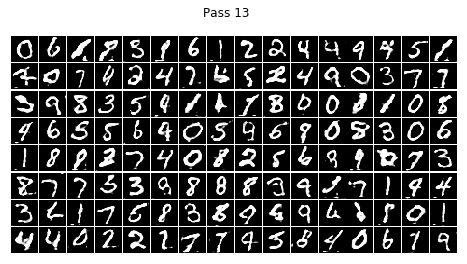

epoch = 13 , batch = 115 , real_d_loss = [0.3838986] , fake_d_loss = [0.33287627] g_loss = [1.5296401]


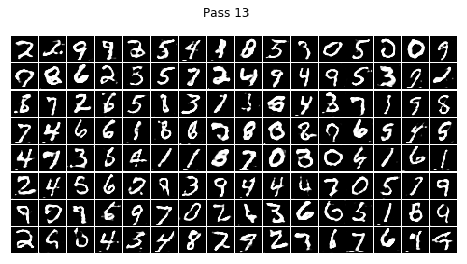

epoch = 13 , batch = 215 , real_d_loss = [0.41847968] , fake_d_loss = [0.30426884] g_loss = [1.6592274]


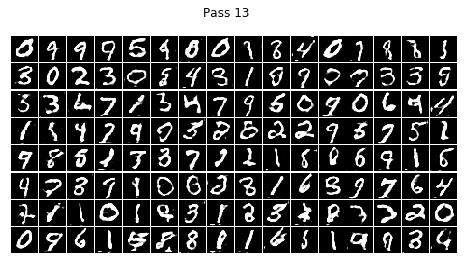

epoch = 13 , batch = 315 , real_d_loss = [0.36461997] , fake_d_loss = [0.31693977] g_loss = [1.5875323]


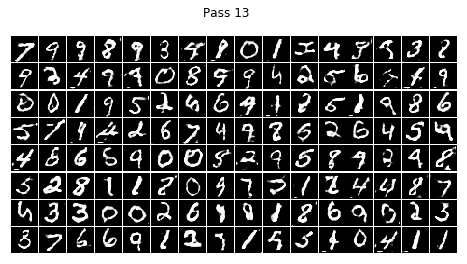

epoch = 13 , batch = 415 , real_d_loss = [0.32225132] , fake_d_loss = [0.2990485] g_loss = [1.6552969]


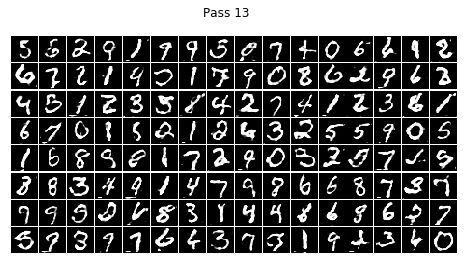

epoch = 14 , batch = 47 , real_d_loss = [0.3853295] , fake_d_loss = [0.33449036] g_loss = [1.542814]


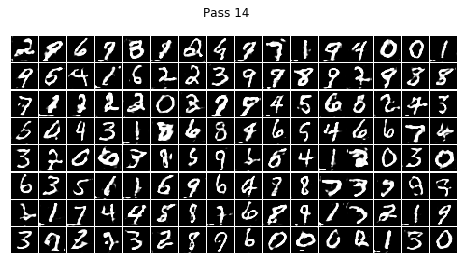

epoch = 14 , batch = 147 , real_d_loss = [0.3189591] , fake_d_loss = [0.30399662] g_loss = [1.6056876]


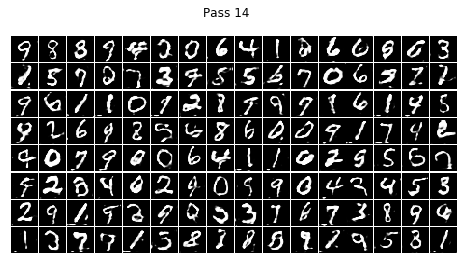

epoch = 14 , batch = 247 , real_d_loss = [0.39374882] , fake_d_loss = [0.32633984] g_loss = [1.5790057]


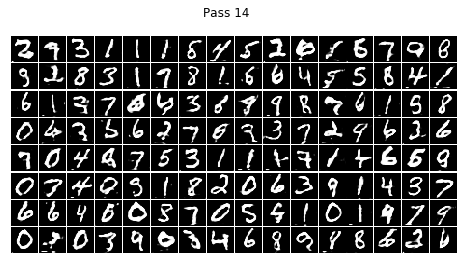

epoch = 14 , batch = 347 , real_d_loss = [0.39762467] , fake_d_loss = [0.34639066] g_loss = [1.5874354]


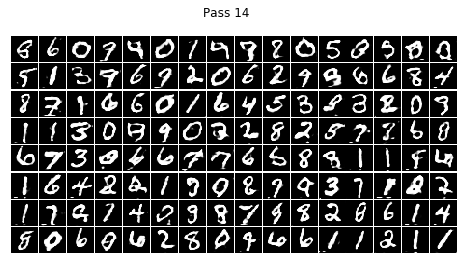

epoch = 14 , batch = 447 , real_d_loss = [0.3933816] , fake_d_loss = [0.34083757] g_loss = [1.5605087]


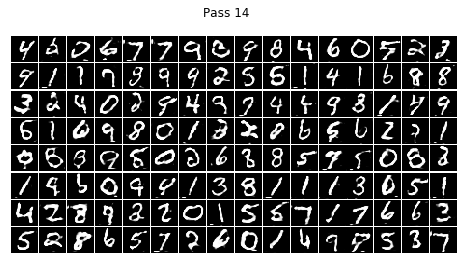

epoch = 15 , batch = 79 , real_d_loss = [0.38487026] , fake_d_loss = [0.2887432] g_loss = [1.6542432]


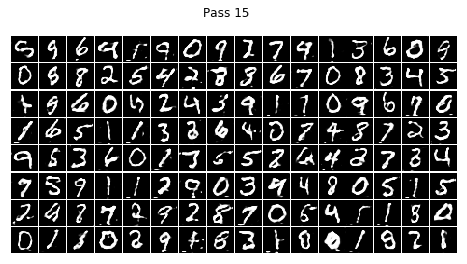

epoch = 15 , batch = 179 , real_d_loss = [0.4088679] , fake_d_loss = [0.29607326] g_loss = [1.6747271]


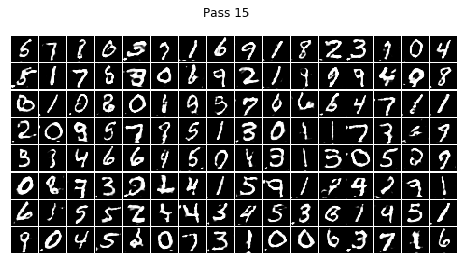

epoch = 15 , batch = 279 , real_d_loss = [0.37163547] , fake_d_loss = [0.32654205] g_loss = [1.598971]


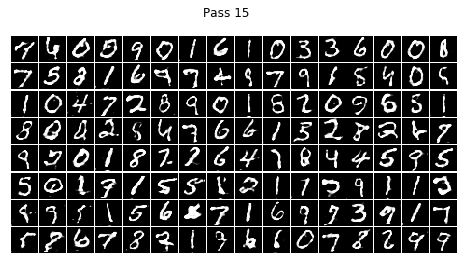

epoch = 15 , batch = 379 , real_d_loss = [0.40419313] , fake_d_loss = [0.3002943] g_loss = [1.6277244]


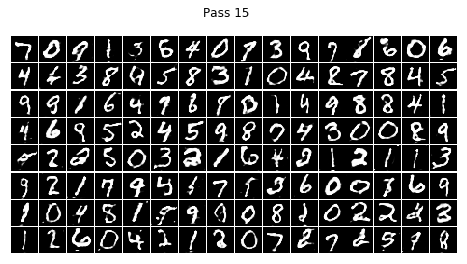

epoch = 16 , batch = 11 , real_d_loss = [0.35024863] , fake_d_loss = [0.3125915] g_loss = [1.6485803]


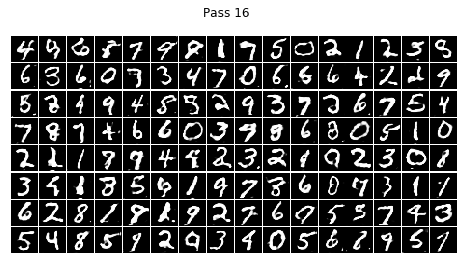

epoch = 16 , batch = 111 , real_d_loss = [0.44718996] , fake_d_loss = [0.31032544] g_loss = [1.6560054]


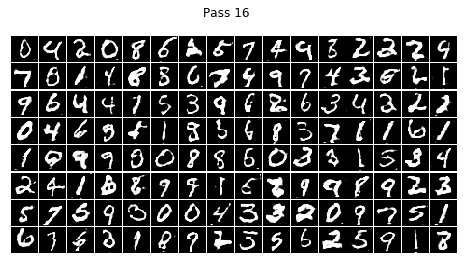

epoch = 16 , batch = 211 , real_d_loss = [0.3907985] , fake_d_loss = [0.29155752] g_loss = [1.6488948]


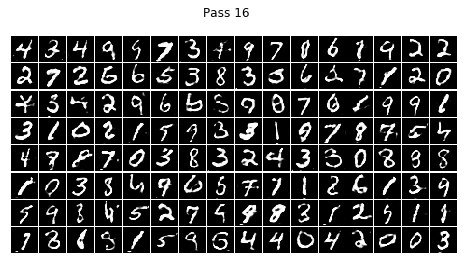

epoch = 16 , batch = 311 , real_d_loss = [0.32554808] , fake_d_loss = [0.3360694] g_loss = [1.53691]


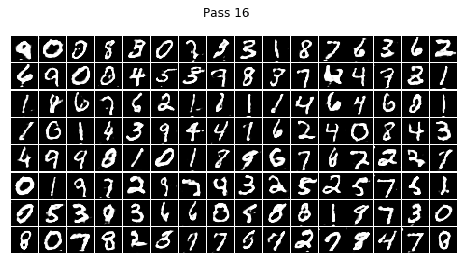

epoch = 16 , batch = 411 , real_d_loss = [0.42704028] , fake_d_loss = [0.36372522] g_loss = [1.4967159]


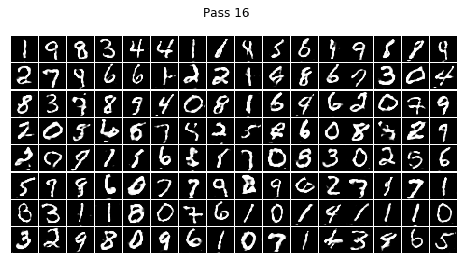

epoch = 17 , batch = 43 , real_d_loss = [0.28300902] , fake_d_loss = [0.30102974] g_loss = [1.6468495]


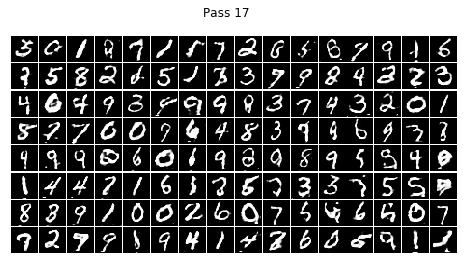

epoch = 17 , batch = 143 , real_d_loss = [0.3746479] , fake_d_loss = [0.31409717] g_loss = [1.5655932]


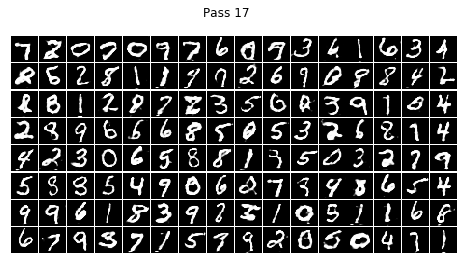

epoch = 17 , batch = 243 , real_d_loss = [0.37043774] , fake_d_loss = [0.29275915] g_loss = [1.6793517]


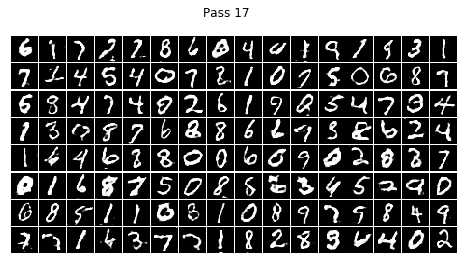

epoch = 17 , batch = 343 , real_d_loss = [0.34011716] , fake_d_loss = [0.3095793] g_loss = [1.62503]


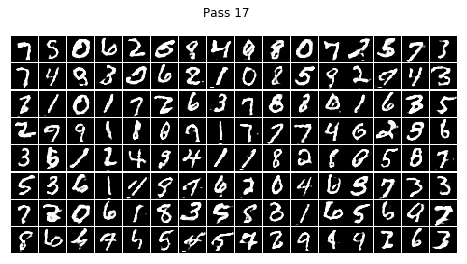

epoch = 17 , batch = 443 , real_d_loss = [0.32657507] , fake_d_loss = [0.3147177] g_loss = [1.6127293]


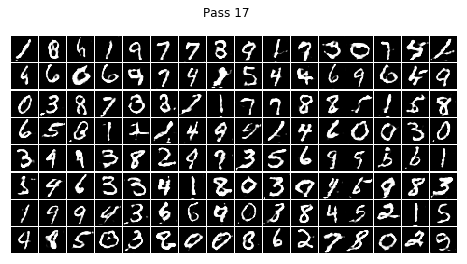

epoch = 18 , batch = 75 , real_d_loss = [0.3401253] , fake_d_loss = [0.29068667] g_loss = [1.6702302]


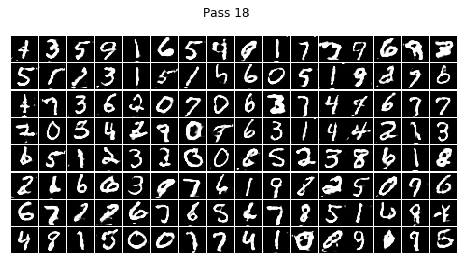

epoch = 18 , batch = 175 , real_d_loss = [0.3703455] , fake_d_loss = [0.33042398] g_loss = [1.5807171]


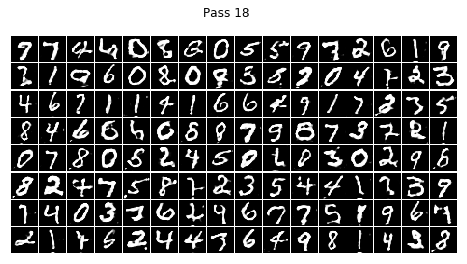

epoch = 18 , batch = 275 , real_d_loss = [0.40993258] , fake_d_loss = [0.26950353] g_loss = [1.7459748]


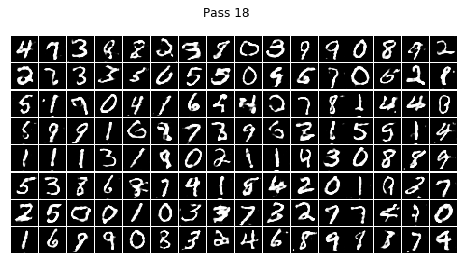

epoch = 18 , batch = 375 , real_d_loss = [0.31391007] , fake_d_loss = [0.3254292] g_loss = [1.5746889]


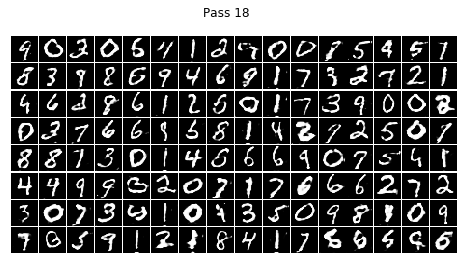

epoch = 19 , batch = 7 , real_d_loss = [0.29492468] , fake_d_loss = [0.30332223] g_loss = [1.641377]


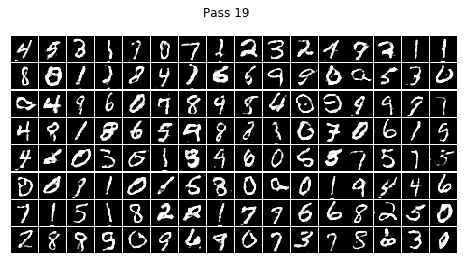

epoch = 19 , batch = 107 , real_d_loss = [0.29636586] , fake_d_loss = [0.302146] g_loss = [1.6712921]


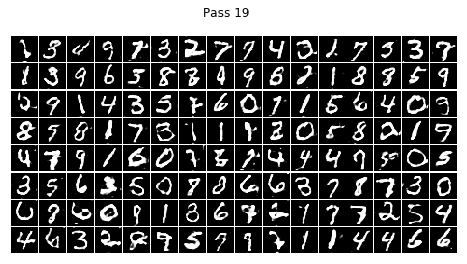

epoch = 19 , batch = 207 , real_d_loss = [0.40327728] , fake_d_loss = [0.30890283] g_loss = [1.6536615]


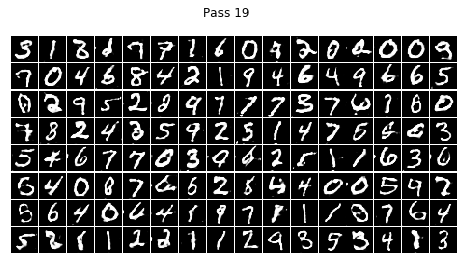

epoch = 19 , batch = 307 , real_d_loss = [0.33441627] , fake_d_loss = [0.3345615] g_loss = [1.5237246]


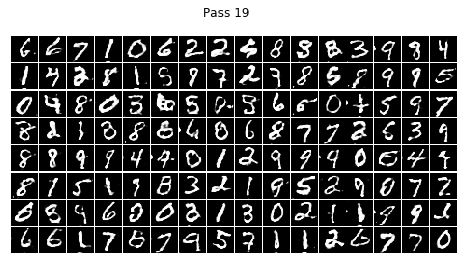

epoch = 19 , batch = 407 , real_d_loss = [0.355668] , fake_d_loss = [0.30865994] g_loss = [1.6009306]


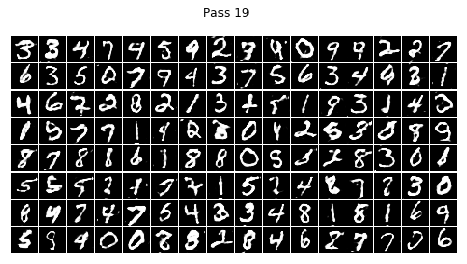

In [43]:


def train(mnist_generator, epoch_num=1, batch_size=128, use_gpu=True, load_model=False):
    place = fluid.CUDAPlace(0) if use_gpu else fluid.CPUPlace()
    with fluid.dygraph.guard(place):
        # 模型存储路径
        model_path = './output/'
        d = D('D')
        d.train()
        g = G('G')
        g.train()
        # 创建优化方法
        real_d_optimizer = fluid.optimizer.AdamOptimizer(learning_rate=2e-4, parameter_list=d.parameters())
        fake_d_optimizer = fluid.optimizer.AdamOptimizer(learning_rate=2e-4, parameter_list=d.parameters())
        g_optimizer = fluid.optimizer.AdamOptimizer(learning_rate=2e-4, parameter_list=g.parameters())
        
        # 读取上次保存的模型
        if load_model == True:
            g_para, g_opt = fluid.load_dygraph(model_path+'g')
            d_para, d_r_opt = fluid.load_dygraph(model_path+'d_o_r')
            # 上面判别器的参数已经读取到d_para了,此处无需再次读取
            _, d_f_opt = fluid.load_dygraph(model_path+'d_o_f')
            g.load_dict(g_para)
            g_optimizer.set_dict(g_opt)
            d.load_dict(d_para)
            real_d_optimizer.set_dict(d_r_opt)
            fake_d_optimizer.set_dict(d_f_opt)

        iteration_num = 0
        for epoch in range(epoch_num):
            for i, real_image in enumerate(mnist_generator()):
                # 丢弃不满整个batch_size的数据
                if(len(real_image) != BATCH_SIZE):
                    continue               
                iteration_num += 1                
                '''
                判别器d通过最小化输入真实图片时判别器d的输出与真值标签ones的交叉熵损失，来优化判别器的参数，
                以增加判别器d识别真实图片real_image为真值标签ones的概率。
                '''
                # 将MNIST数据集里的图片读入real_image，将真值标签ones用数字1初始化
                real_image = fluid.dygraph.to_variable(np.array(real_image))
                ones = fluid.dygraph.to_variable(np.ones([len(real_image), 1]).astype('float32'))
                # 计算判别器d判断真实图片的概率
                p_real = d(real_image)
                # 计算判别真图片为真的损失
                real_cost = fluid.layers.sigmoid_cross_entropy_with_logits(p_real, ones)
                real_avg_cost = fluid.layers.mean(real_cost)
                # 反向传播更新判别器d的参数
                real_avg_cost.backward()
                real_d_optimizer.minimize(real_avg_cost)
                d.clear_gradients()
                
                '''
                判别器d通过最小化输入生成器g生成的假图片g(z)时判别器的输出与假值标签zeros的交叉熵损失，
                来优化判别器d的参数，以增加判别器d识别生成器g生成的假图片g(z)为假值标签zeros的概率。
                '''
                # 创建高斯分布的噪声z，将假值标签zeros初始化为0
                z = next(z_generator())
                z = fluid.dygraph.to_variable(np.array(z))
                zeros = fluid.dygraph.to_variable(np.zeros([len(real_image), 1]).astype('float32'))
                # 判别器d判断生成器g生成的假图片的概率
                p_fake = d(g(z))
                # 计算判别生成器g生成的假图片为假的损失
                fake_cost = fluid.layers.sigmoid_cross_entropy_with_logits(p_fake, zeros)
                fake_avg_cost = fluid.layers.mean(fake_cost)
                # 反向传播更新判别器d的参数
                fake_avg_cost.backward()
                fake_d_optimizer.minimize(fake_avg_cost)
                d.clear_gradients()

                '''
                生成器g通过最小化判别器d判别生成器生成的假图片g(z)为真的概率d(fake)与真值标签ones的交叉熵损失，
                来优化生成器g的参数，以增加生成器g使判别器d判别其生成的假图片g(z)为真值标签ones的概率。
                '''
                # 生成器用输入的高斯噪声z生成假图片
                fake = g(z)
                # 计算判别器d判断生成器g生成的假图片的概率
                p_confused = d(fake)
                # 使用判别器d判断生成器g生成的假图片的概率与真值ones的交叉熵计算损失
                g_cost = fluid.layers.sigmoid_cross_entropy_with_logits(p_confused, ones)
                g_avg_cost = fluid.layers.mean(g_cost)
                # 反向传播更新生成器g的参数
                g_avg_cost.backward()
                g_optimizer.minimize(g_avg_cost)
                g.clear_gradients()
                
                # 打印输出
                if(iteration_num % 100 == 0):
                    print('epoch =', epoch, ', batch =', i, ', real_d_loss =', real_avg_cost.numpy(),
                     ', fake_d_loss =', fake_avg_cost.numpy(), 'g_loss =', g_avg_cost.numpy())
                    show_image_grid(fake.numpy(), BATCH_SIZE, epoch)                             
        
        # 存储模型
        fluid.save_dygraph(g.state_dict(), model_path+'g')
        fluid.save_dygraph(g_optimizer.state_dict(), model_path+'g')
        fluid.save_dygraph(d.state_dict(), model_path+'d_o_r')
        fluid.save_dygraph(real_d_optimizer.state_dict(), model_path+'d_o_r')
        fluid.save_dygraph(d.state_dict(), model_path+'d_o_f')
        fluid.save_dygraph(fake_d_optimizer.state_dict(), model_path+'d_o_f')

train(mnist_generator, epoch_num=20, batch_size=BATCH_SIZE, use_gpu=True) # 10
